<a href="https://colab.research.google.com/github/akshat2635/auto-eval/blob/main/auto_eval_ocr.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install easyocr

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 13.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 908.3/908.3 kB 25.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 307.2/307.2 kB 23.5 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manyl

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
# required modules
import numpy as np
import pandas as pd
import cv2
import matplotlib.pyplot as plt
import os
import shutil
import PIL.Image
from PIL import Image

In [4]:
dir="/content/drive/MyDrive/anand_mishra/Train_Samples_V0"
arr=[]
imgs=[]
for root,dirs,files in os.walk(dir):
    for file in files:
        path=dir+"/"+file
        arr.append(path)
        img=cv2.imread(path)
        # img=cv2.resize(img,(1700,2000))
        img=cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
        # plt.imshow(img,cmap='gray')
        print(img.shape)
        # break;
        imgs.append(img)

(8042, 6886)
(7981, 6863)
(8067, 6877)
(7923, 6913)
(7929, 6887)
(8160, 6930)
(7996, 6857)
(7789, 6864)
(7821, 6897)
(7955, 6898)
(7825, 6860)
(8059, 6916)
(7812, 6826)
(8026, 6862)
(7865, 6842)
(7881, 6882)
(7888, 6839)
(7831, 6878)
(8076, 6889)
(8099, 6917)
(7796, 6871)
(7763, 6865)
(7838, 6895)
(7911, 6877)
(7826, 6859)
(7804, 6902)
(7980, 6911)
(7924, 6884)


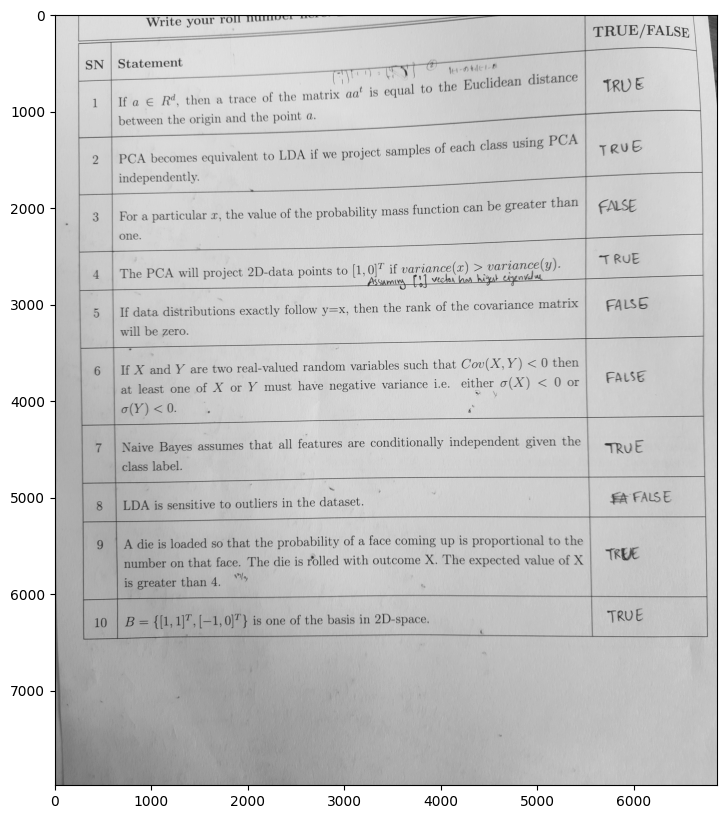

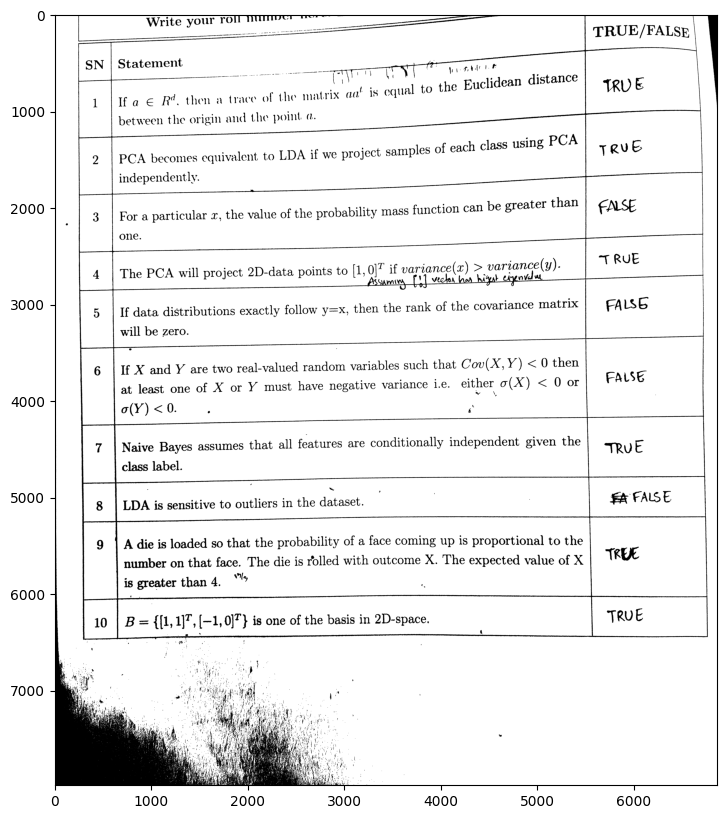

In [61]:
def preprocess_image(img):

    # Apply thresholding to binarize the image
    _, binary_img = cv2.threshold(img, 128, 255, cv2.THRESH_BINARY)

    # Apply morphological operations to enhance the text
    kernel = np.ones((3, 3), np.uint8)
    morphed_img = cv2.morphologyEx(binary_img, cv2.MORPH_CLOSE, kernel)

    return morphed_img
plt.figure(figsize = (15,10))
plt.imshow(imgs[1],cmap='gray')
plt.show()
plt.figure(figsize = (15,10))
plt.imshow(preprocess_image(imgs[1]),cmap='gray')

In [7]:
import easyocr
from pylab import rcParams
from IPython.display import Image

In [8]:
reader = easyocr.Reader(['en'],gpu = True)

Progress: |██████████████████████████████████████████████████| 100.0% Complete

Progress: |██████████████████████████████████████████████████| 100.0% Complete

In [65]:
def extract_tf(image1,path):
    image=image1.copy()
    image=preprocess_image(image)
    res = reader.readtext(path)
    height,width=image.shape[:2]
    bound=width
    cur=1
    texts=[]
    cropped_images = []
    for (bbox, text, prob) in res:
        # cur+=1
    # unpack the bounding box
        (tl, tr, br, bl) = bbox
        tl = (int(tl[0]), int(tl[1]))
        tr = (int(tr[0]), int(tr[1]))
        br = (int(br[0]), int(br[1]))
        bl = (int(bl[0]), int(bl[1]))
        #   print(tl,bound)
        if(cur==1 and ('TRUE' in text)):
            bound=tl[0]-50
            cur=0
            continue

        if(tl[0]>bound):
            # print(text)
            if text[0]=='T' or text[0]=='t':
                cv2.rectangle(image, tl, br, (0, 255, 0), 8)
                cv2.putText(image,"True", (tl[0], tl[1] - 10),cv2.FONT_HERSHEY_SIMPLEX, 5, (0, 255, 0), 5)
                texts.append('True')
                cropped_img = image[tl[1]:br[1], tl[0]:br[0]]
                cropped_images.append(cropped_img)
            elif text[0]=='F' or text[0]=='f':
                cv2.rectangle(image, tl, br, (0, 255, 0), 8)
                cv2.putText(image, "False", (tl[0], tl[1] - 10),cv2.FONT_HERSHEY_SIMPLEX, 5, (0, 255, 0), 5)
                texts.append('False')
                cropped_img = image[tl[1]:br[1], tl[0]:br[0]]
                cropped_images.append(cropped_img)

    return image,cropped_images,texts
def display_images(images):
    n = len(images)
    # print(n)
    plt.figure(figsize=(6, 3))
    for i in range(0,min(n,10)):
        plt.subplot(2, 5, i+1)
        plt.imshow(images[i], cmap='gray')
        # plt.title(titles[i])
        plt.axis('off')
    plt.show()

['False', 'False', 'True', 'True', 'True', 'True', 'True', 'True', 'True']


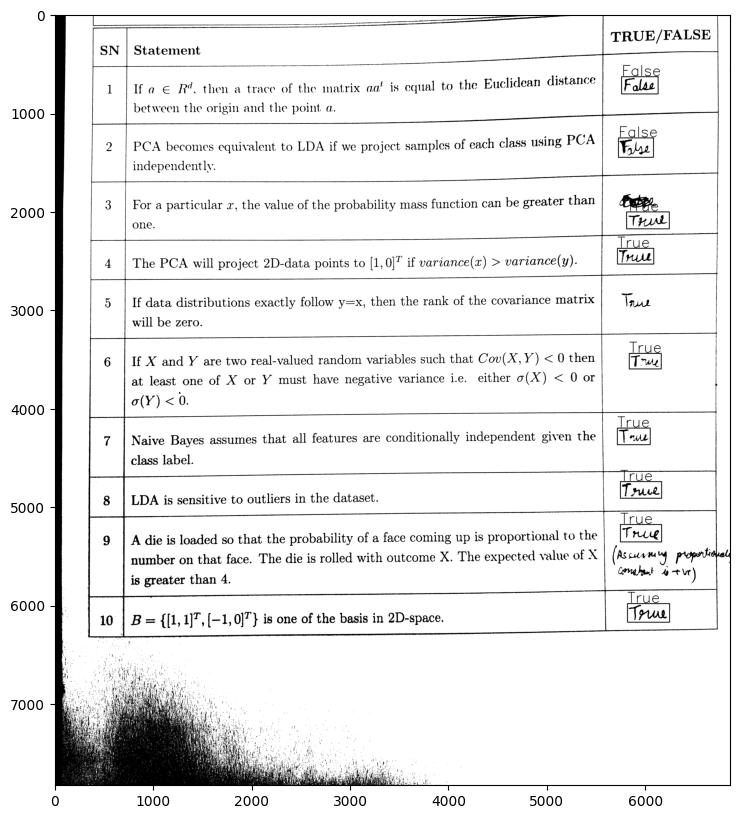

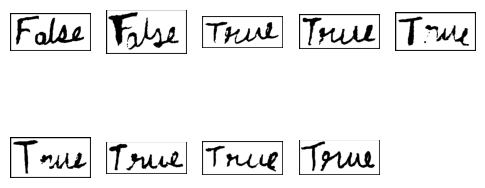

In [66]:
img,cur,texts=extract_tf(imgs[24],arr[24])
print(texts)
plt.figure(figsize=(10,10))
plt.imshow(img,cmap='gray')
plt.show()
display_images(cur)

1


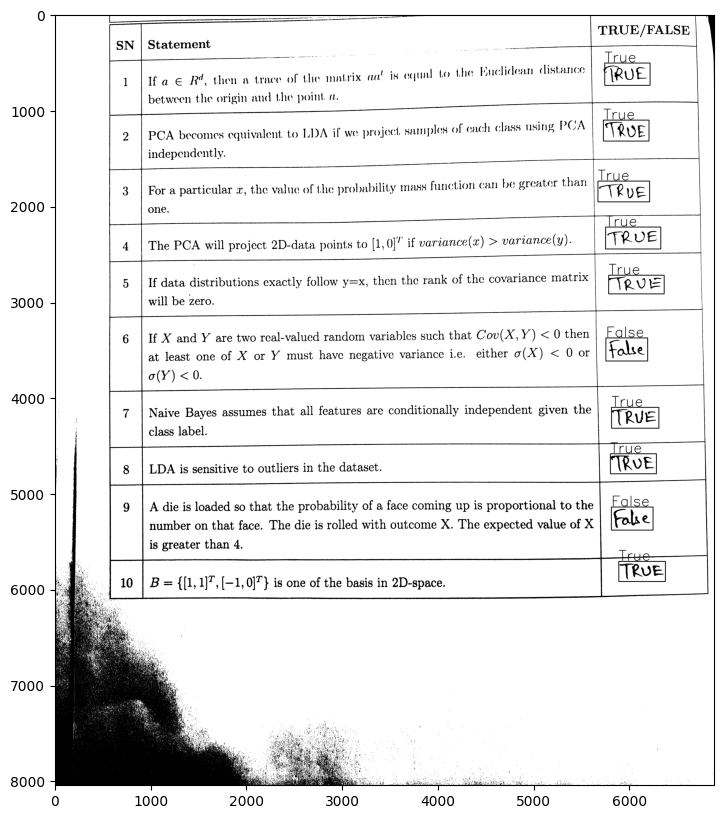

10 ['True', 'True', 'True', 'True', 'True', 'False', 'True', 'True', 'False', 'True']


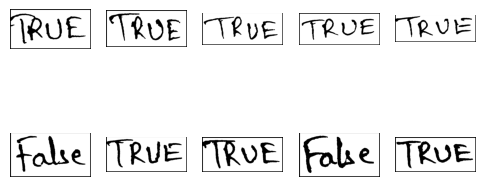

2


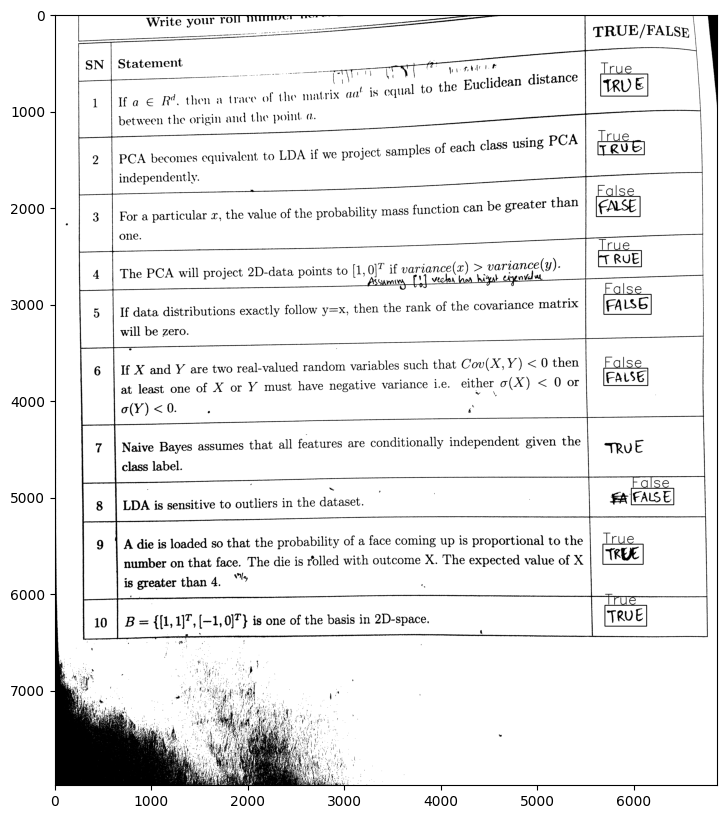

9 ['True', 'False', 'True', 'False', 'False', 'False', 'True', 'True', 'True']


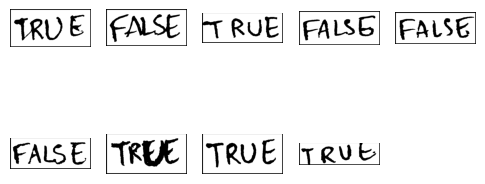

3


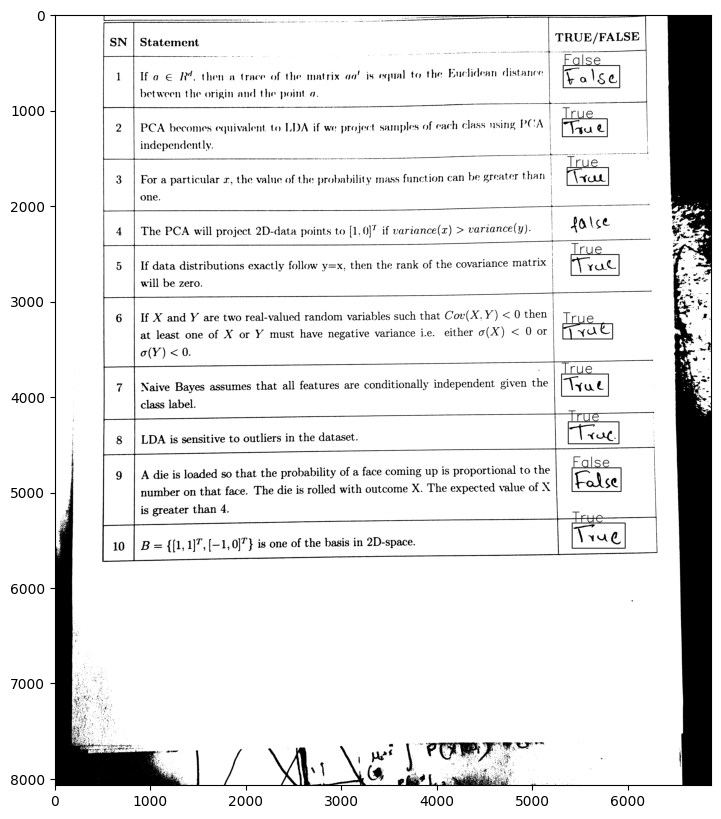

9 ['False', 'True', 'True', 'True', 'True', 'True', 'False', 'True', 'True']


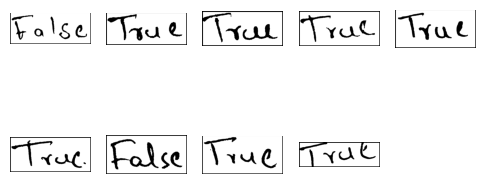

4


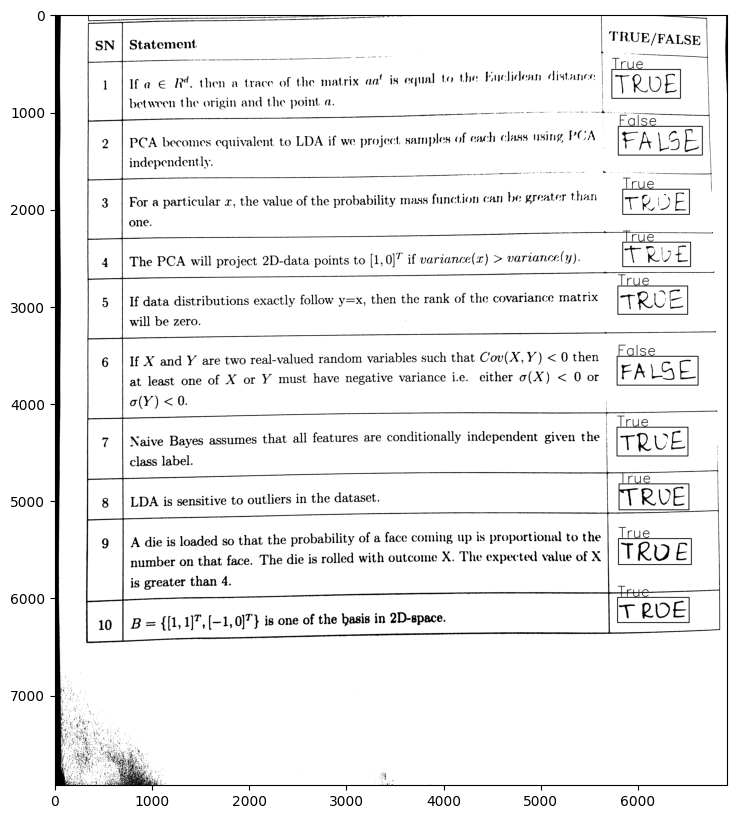

10 ['True', 'False', 'True', 'True', 'True', 'False', 'True', 'True', 'True', 'True']


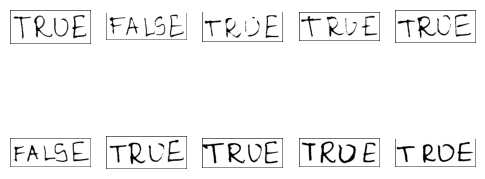

5


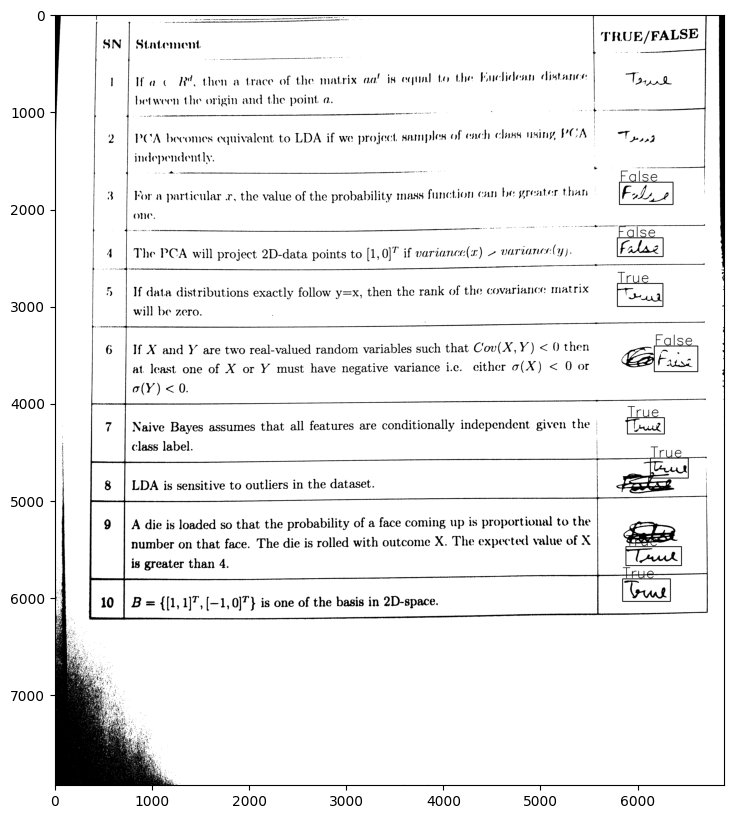

8 ['False', 'False', 'False', 'True', 'True', 'True', 'True', 'True']


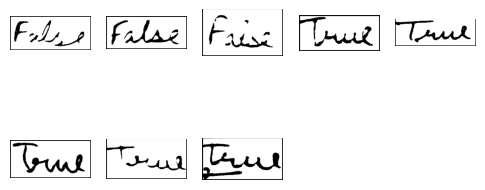

6


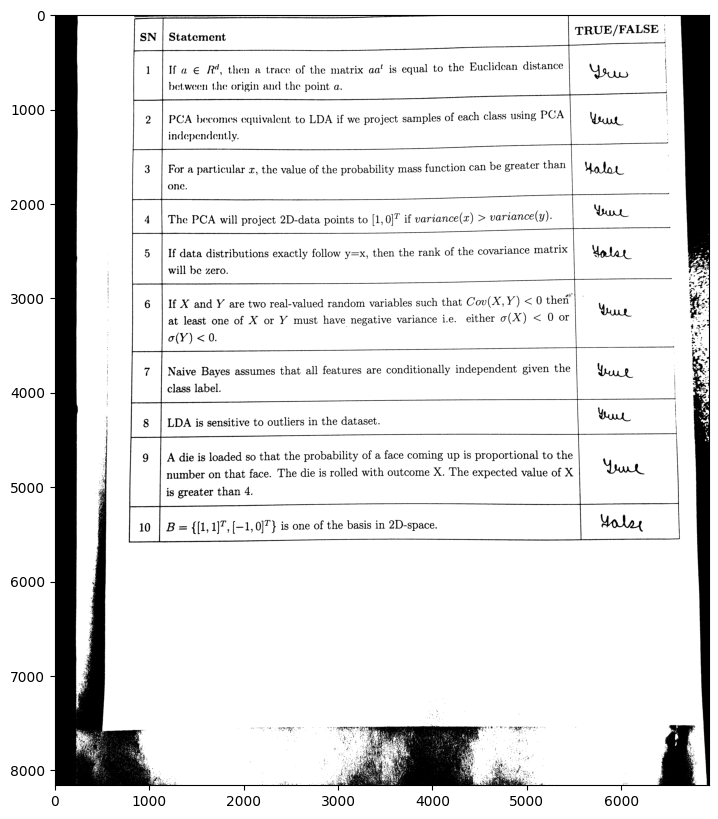

0 []


<Figure size 600x300 with 0 Axes>

7


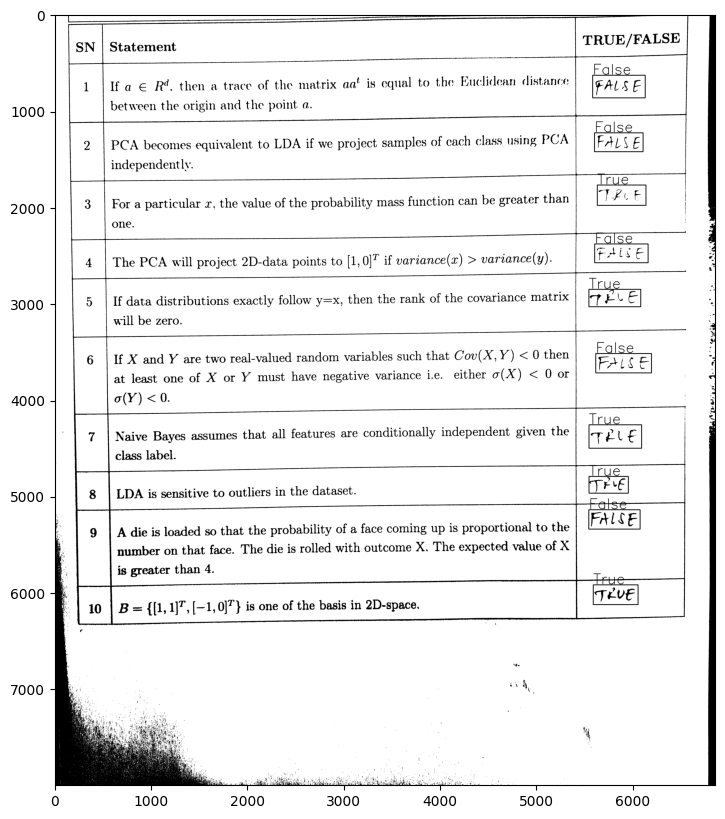

10 ['False', 'False', 'True', 'False', 'False', 'True', 'False', 'True', 'True', 'True']


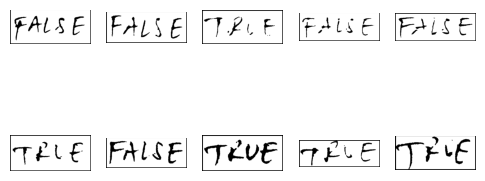

8


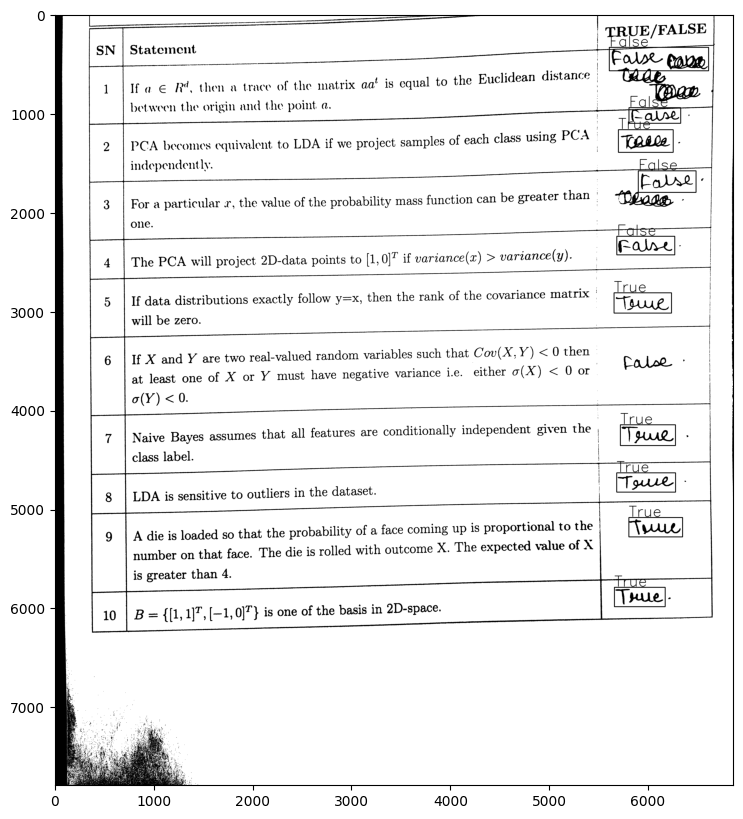

10 ['False', 'False', 'True', 'False', 'False', 'True', 'True', 'True', 'True', 'True']


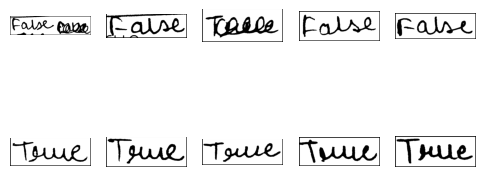

9


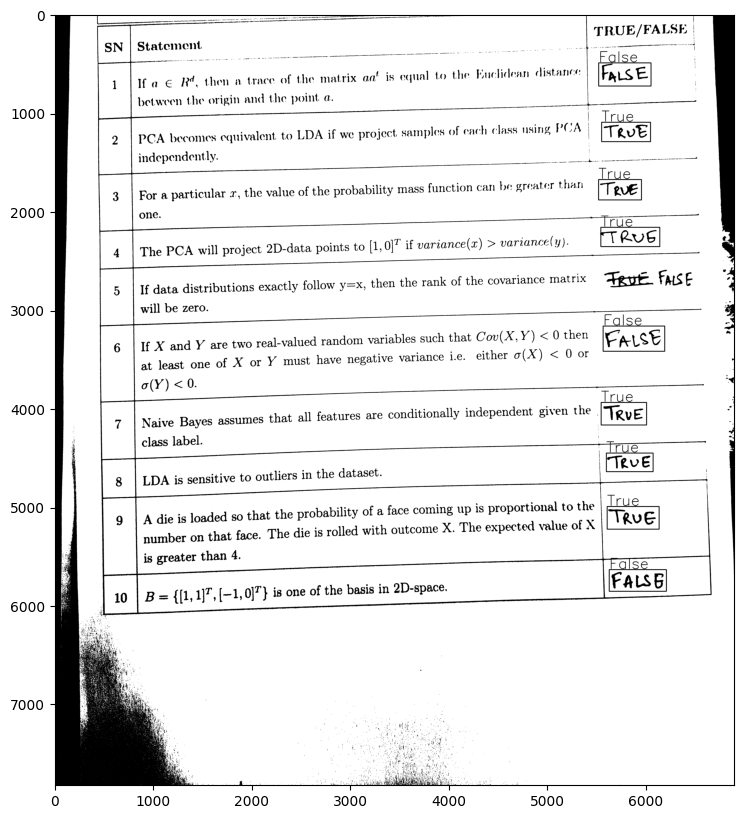

9 ['False', 'True', 'True', 'True', 'False', 'True', 'True', 'True', 'False']


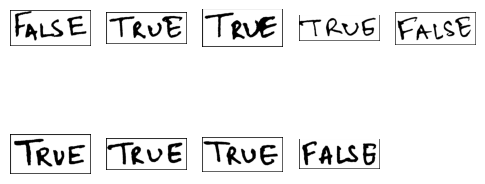

10


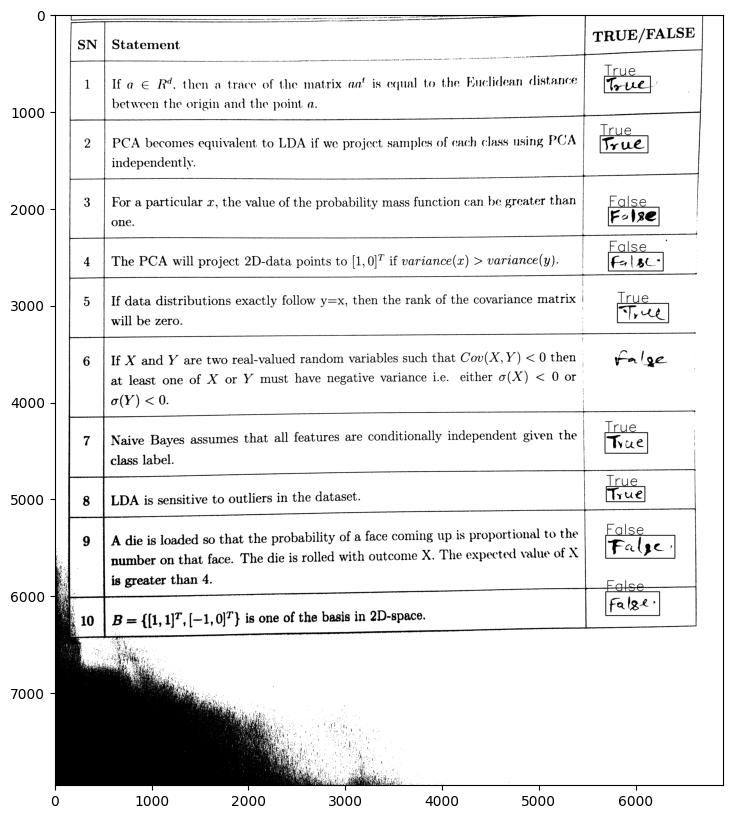

9 ['True', 'True', 'False', 'False', 'True', 'True', 'True', 'False', 'False']


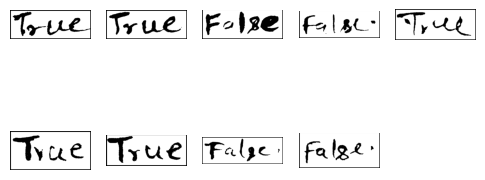

11


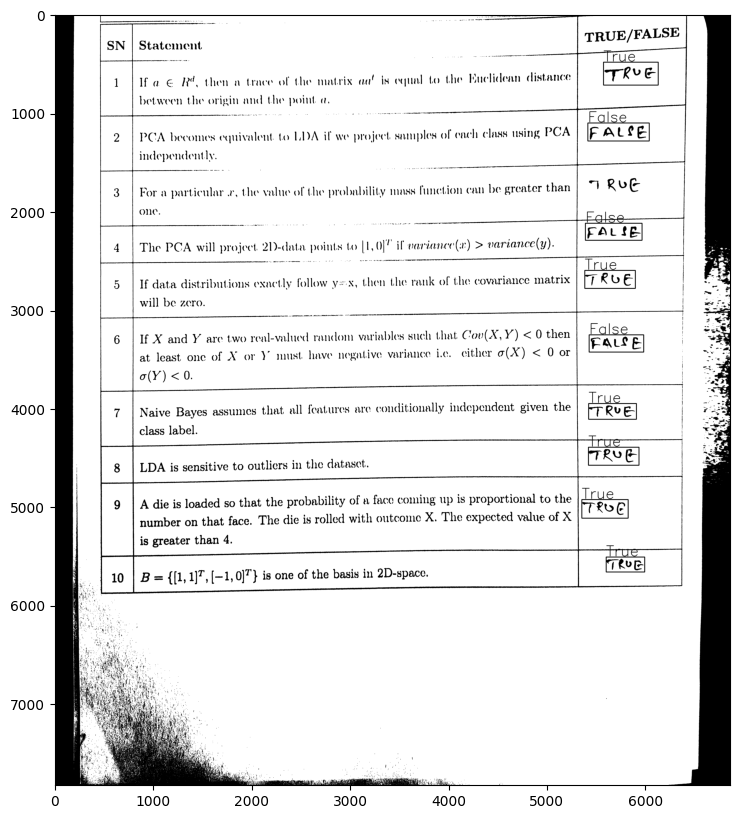

9 ['True', 'False', 'False', 'True', 'False', 'True', 'True', 'True', 'True']


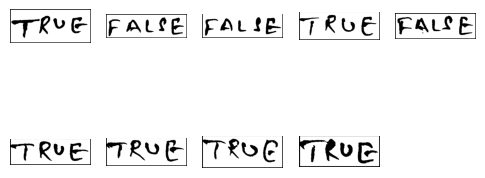

12


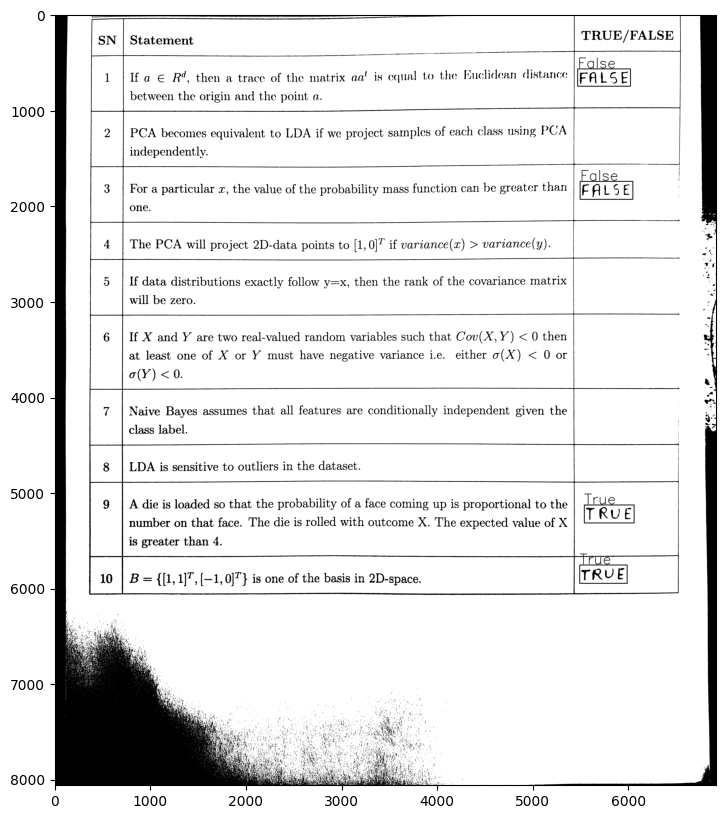

4 ['False', 'False', 'True', 'True']


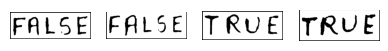

13


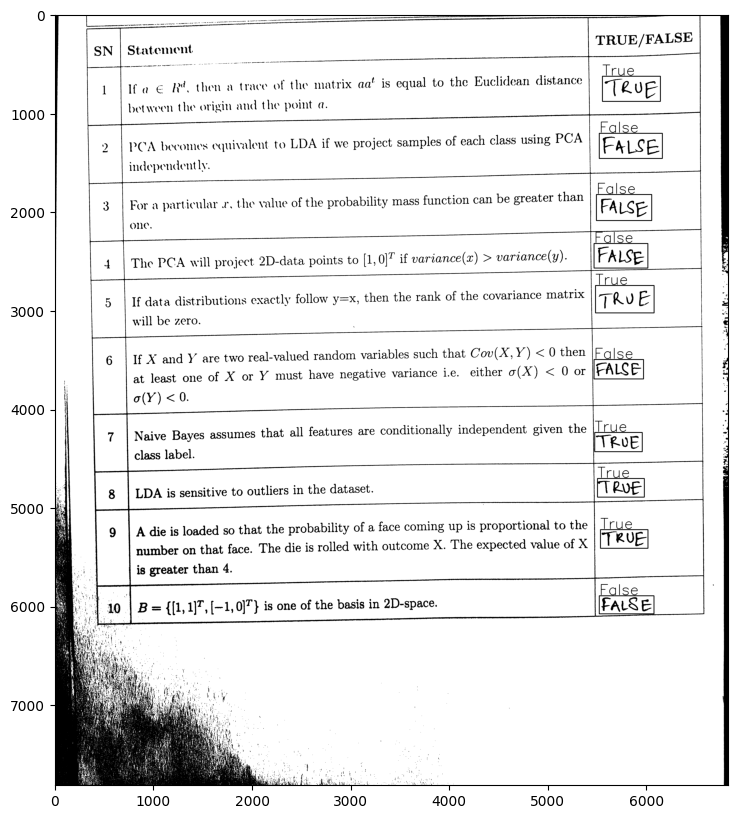

10 ['True', 'False', 'False', 'False', 'True', 'False', 'True', 'True', 'True', 'False']


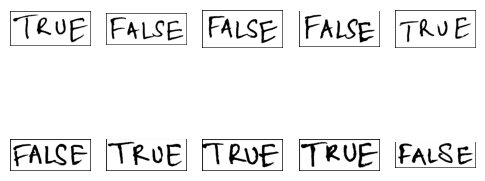

14


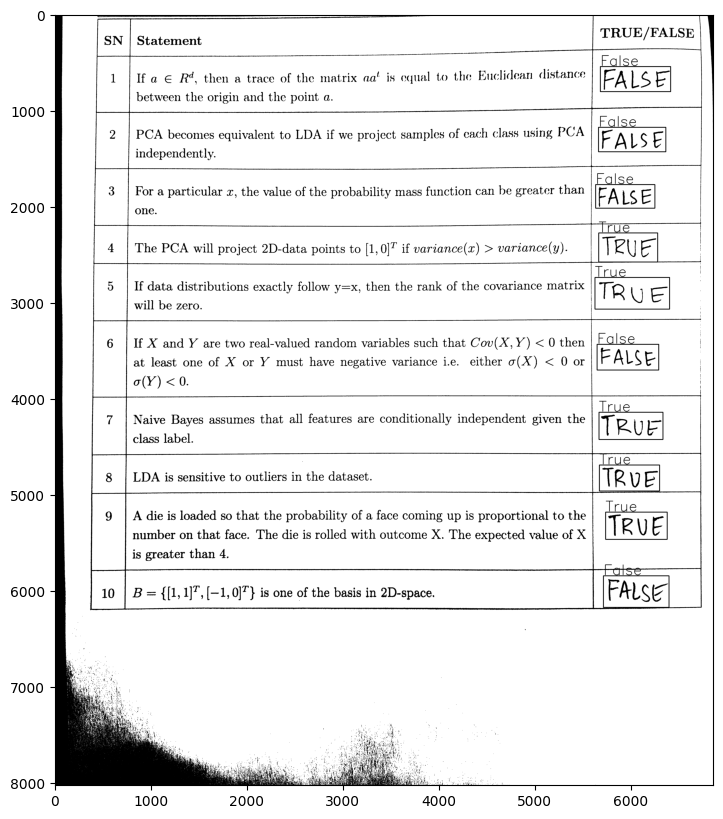

10 ['False', 'False', 'False', 'True', 'True', 'False', 'True', 'True', 'True', 'False']


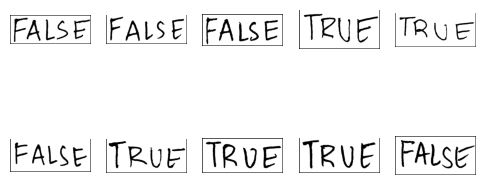

15


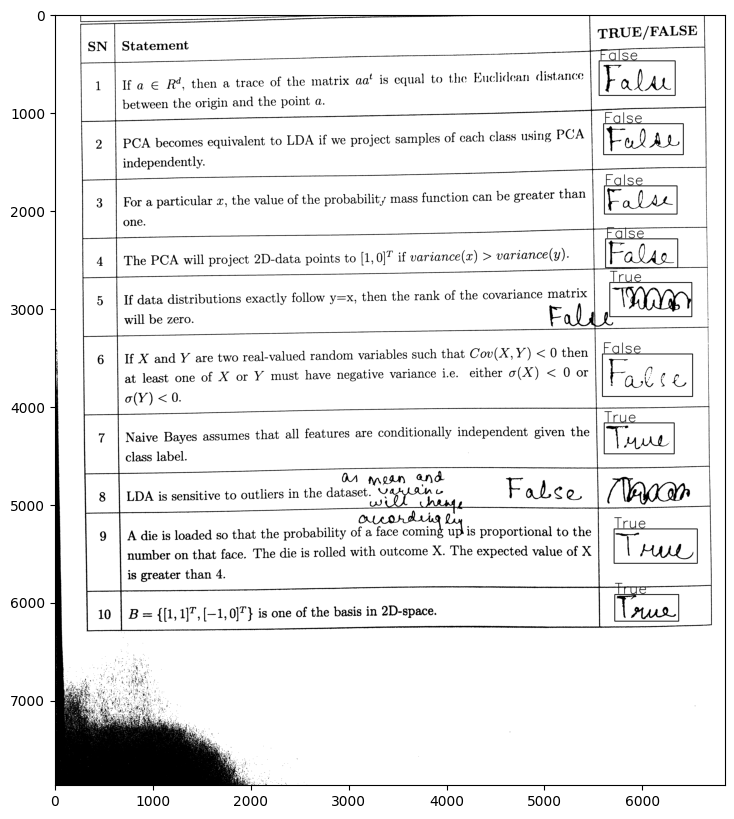

9 ['False', 'False', 'False', 'False', 'True', 'False', 'True', 'True', 'True']


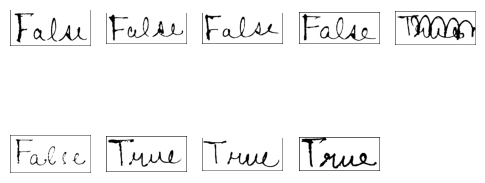

16


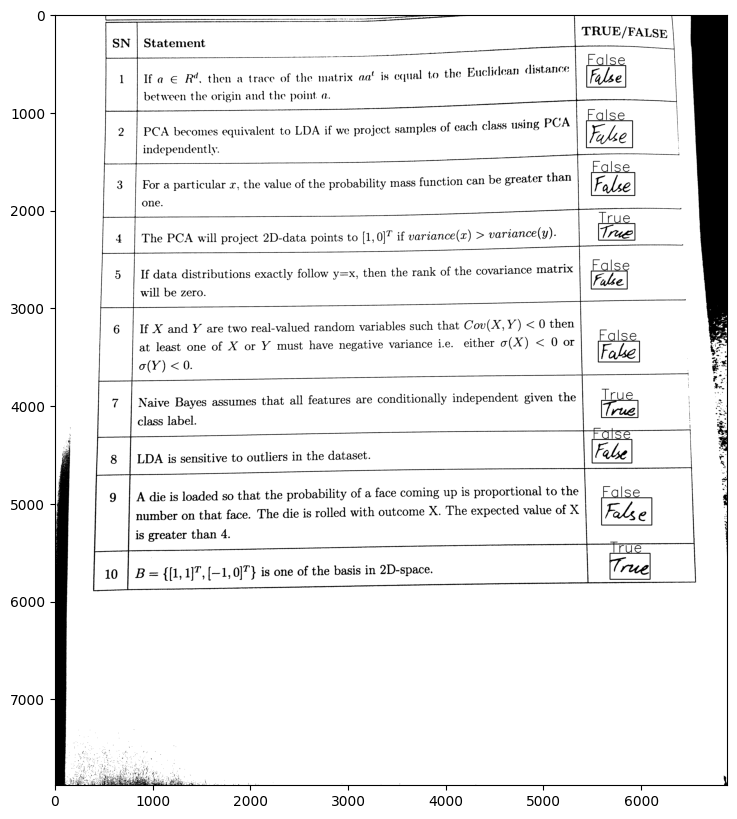

10 ['False', 'False', 'False', 'True', 'False', 'False', 'True', 'False', 'False', 'True']


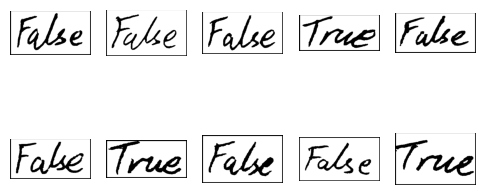

17


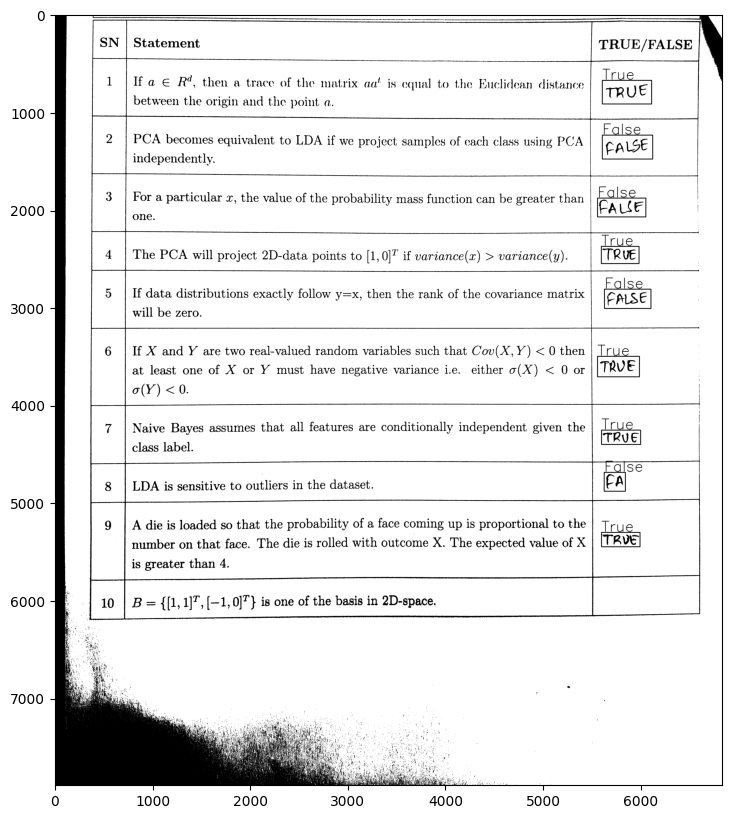

9 ['True', 'False', 'False', 'True', 'False', 'True', 'True', 'False', 'True']


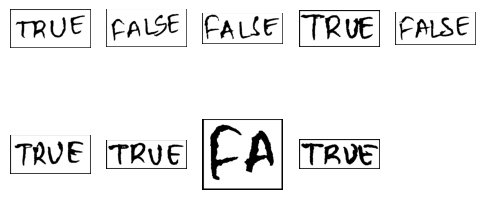

18


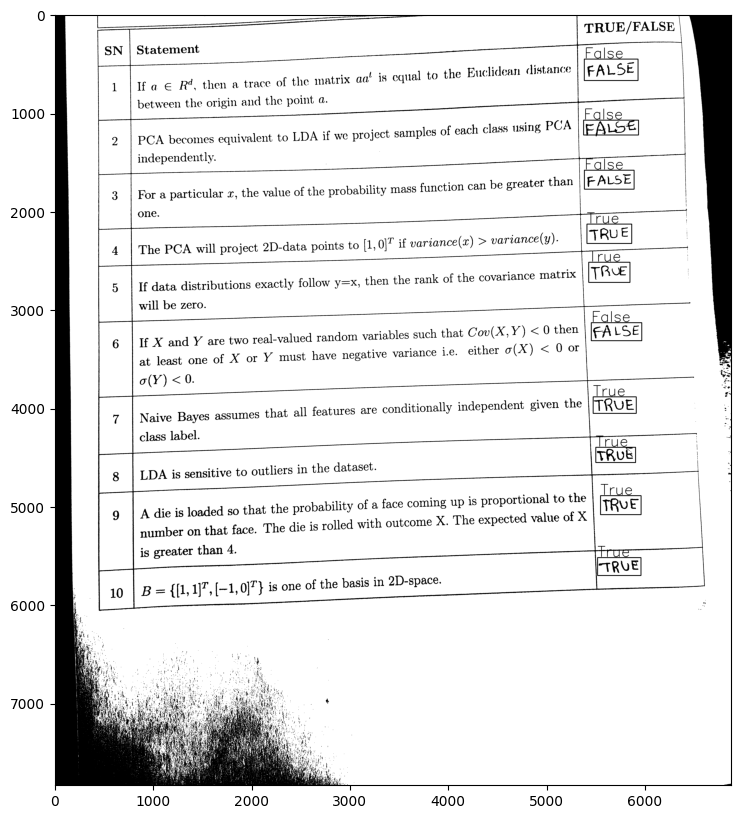

10 ['False', 'False', 'True', 'True', 'False', 'True', 'True', 'True', 'False', 'True']


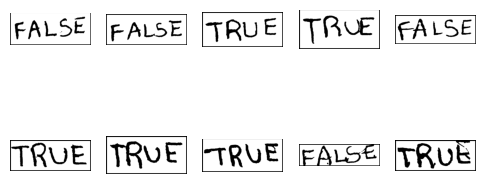

19


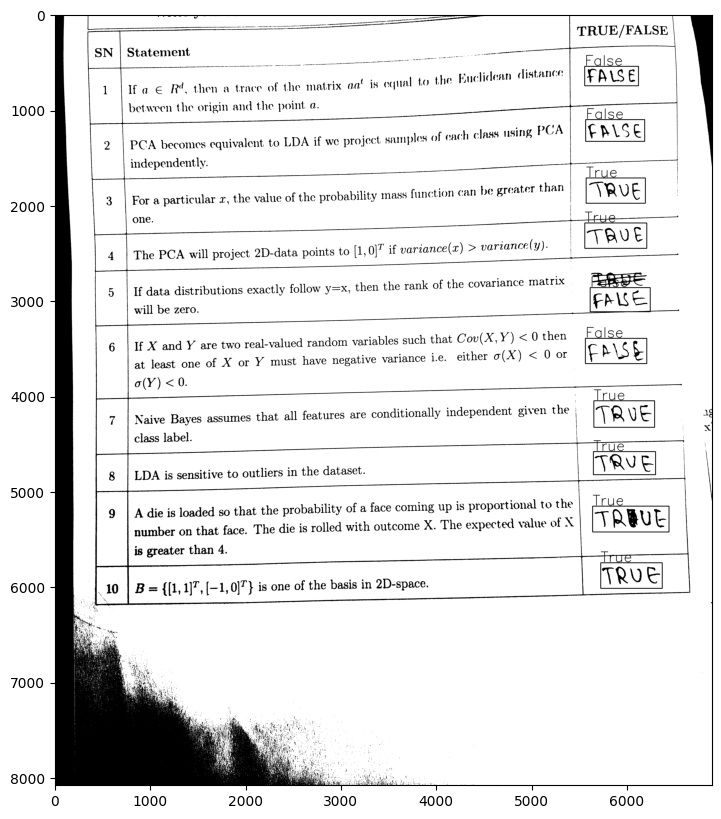

10 ['False', 'False', 'True', 'True', 'False', 'False', 'True', 'True', 'True', 'True']


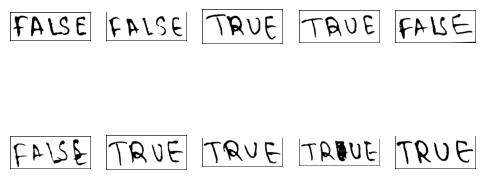

20


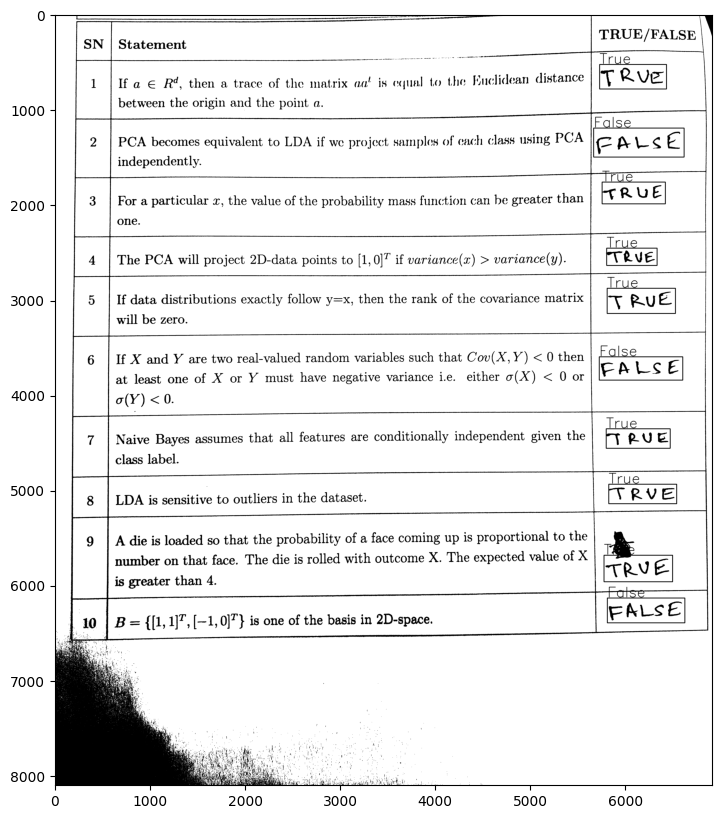

10 ['True', 'False', 'True', 'True', 'True', 'False', 'True', 'True', 'True', 'False']


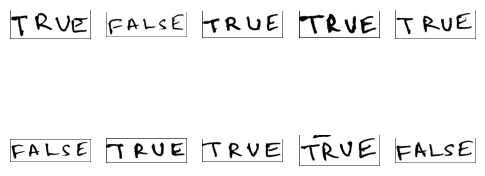

21


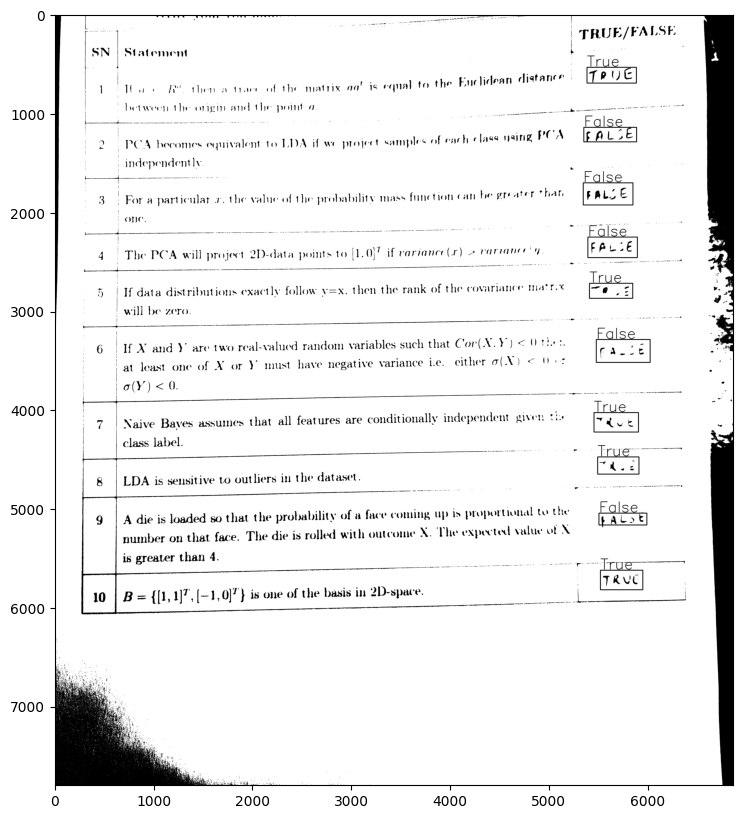

10 ['False', 'False', 'True', 'False', 'True', 'True', 'True', 'True', 'False', 'False']


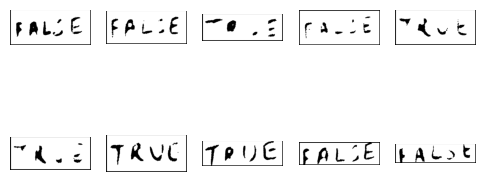

22


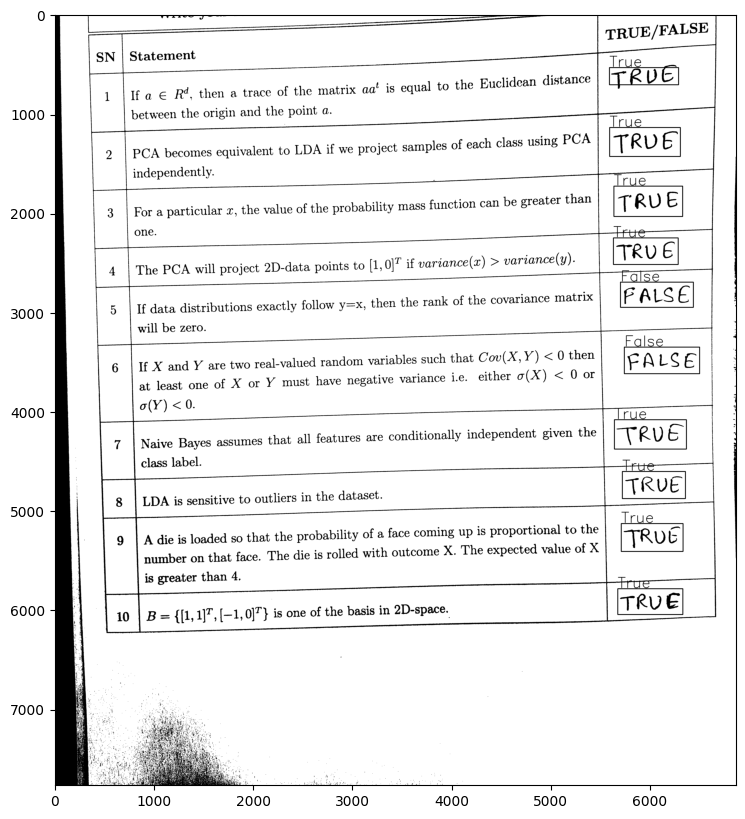

10 ['True', 'True', 'True', 'False', 'False', 'True', 'True', 'True', 'True', 'True']


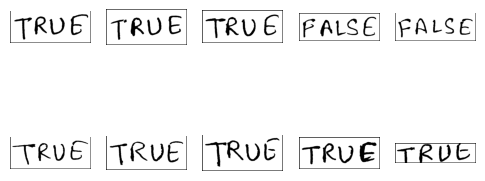

23


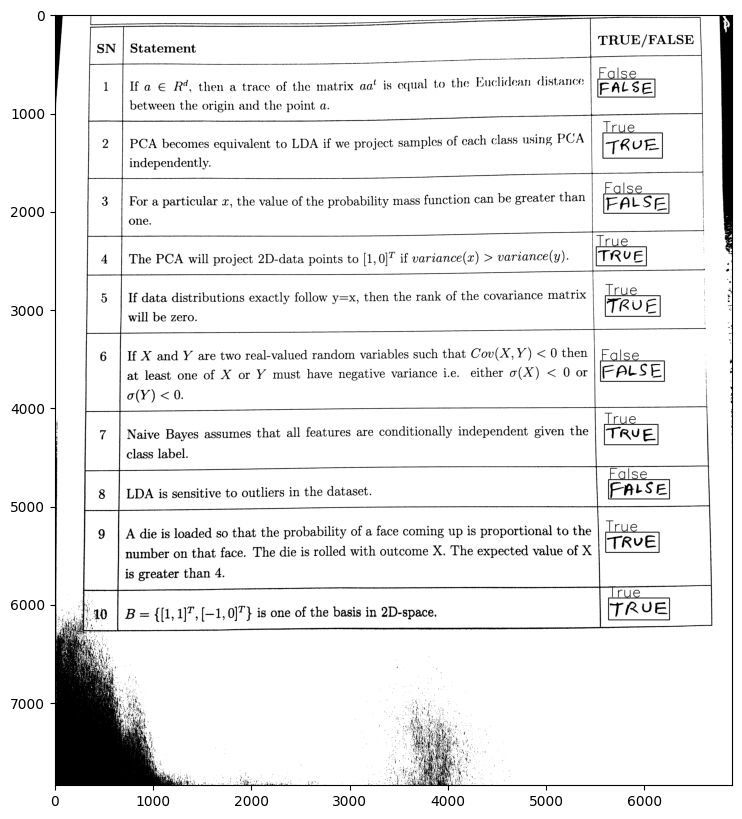

10 ['False', 'True', 'False', 'True', 'True', 'False', 'True', 'False', 'True', 'True']


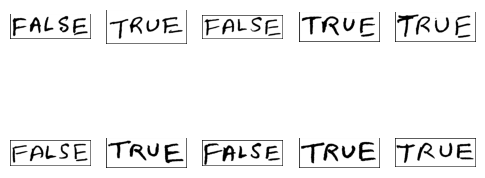

24


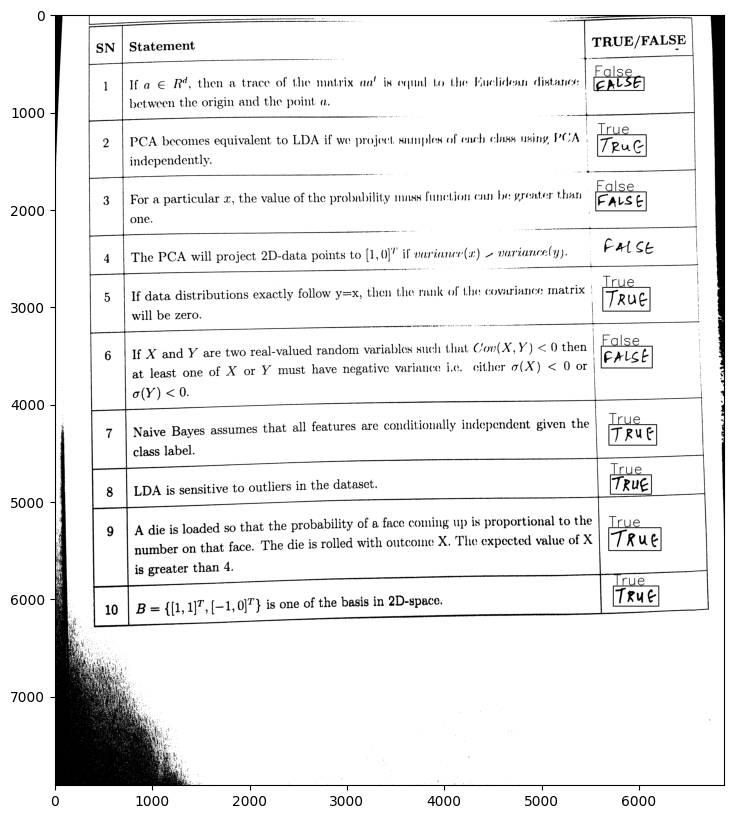

9 ['True', 'False', 'True', 'False', 'True', 'True', 'True', 'True', 'False']


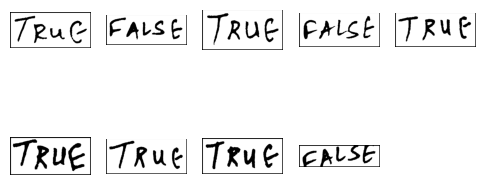

25


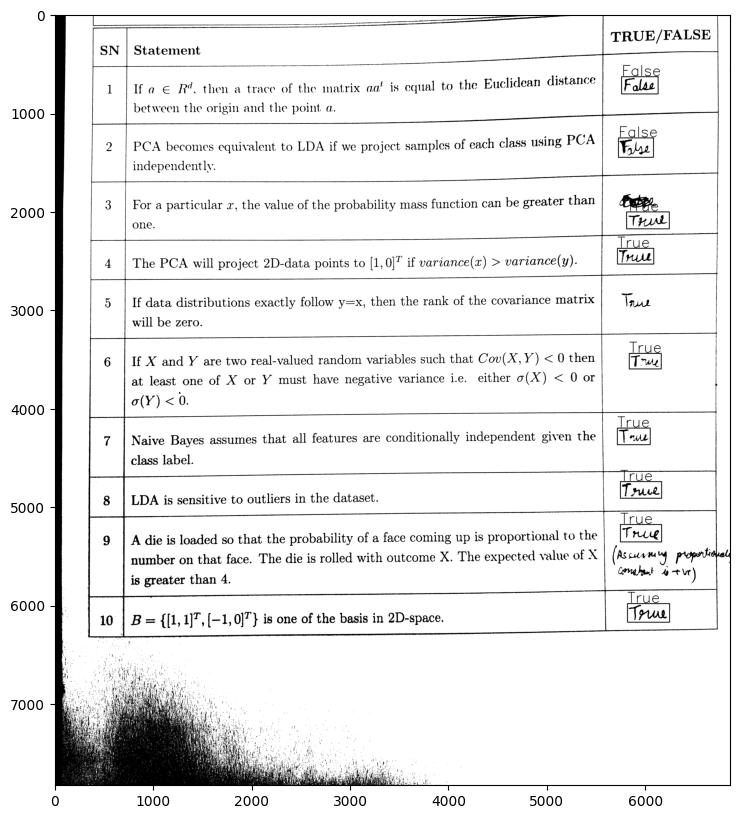

9 ['False', 'False', 'True', 'True', 'True', 'True', 'True', 'True', 'True']


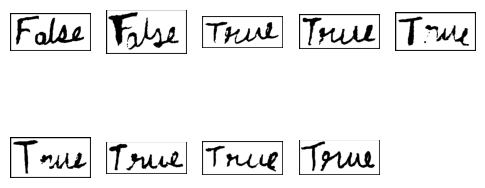

26


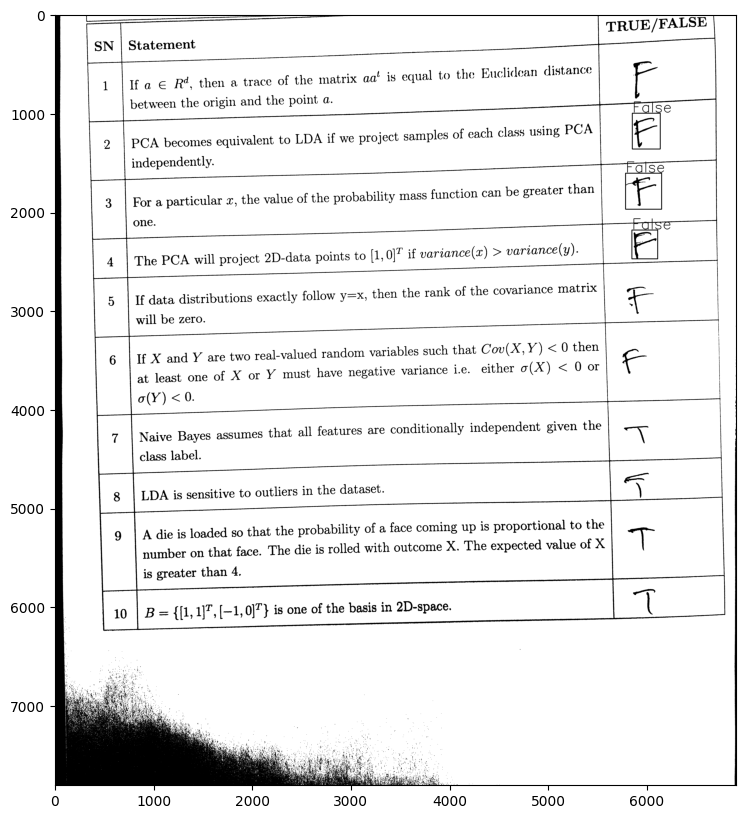

3 ['False', 'False', 'False']


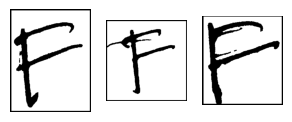

27


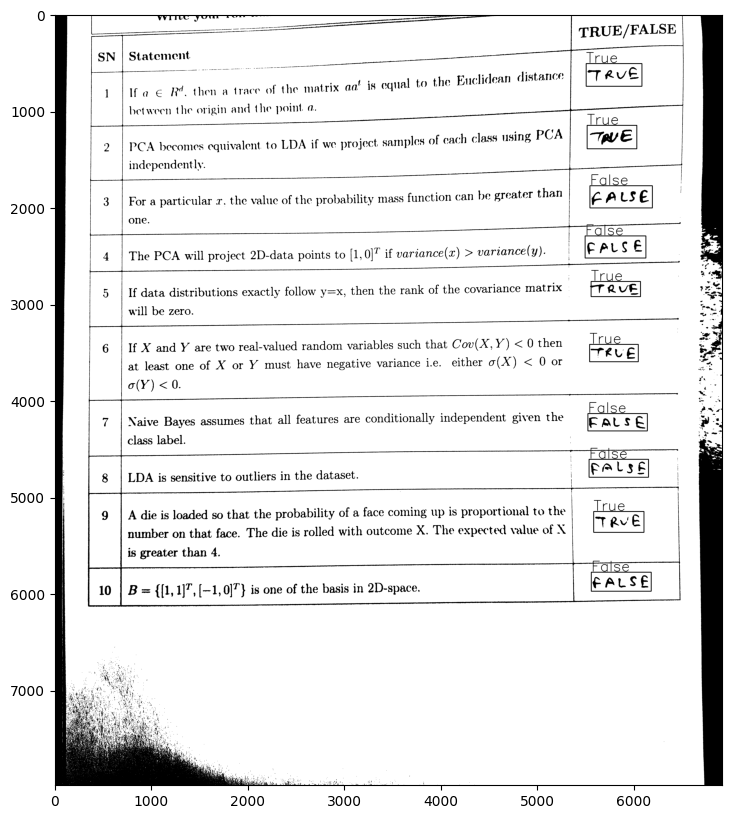

10 ['True', 'True', 'False', 'False', 'True', 'True', 'False', 'False', 'True', 'False']


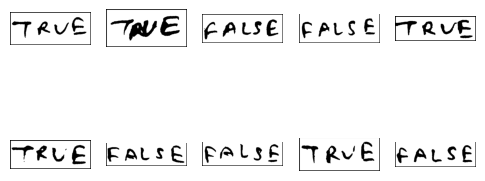

28


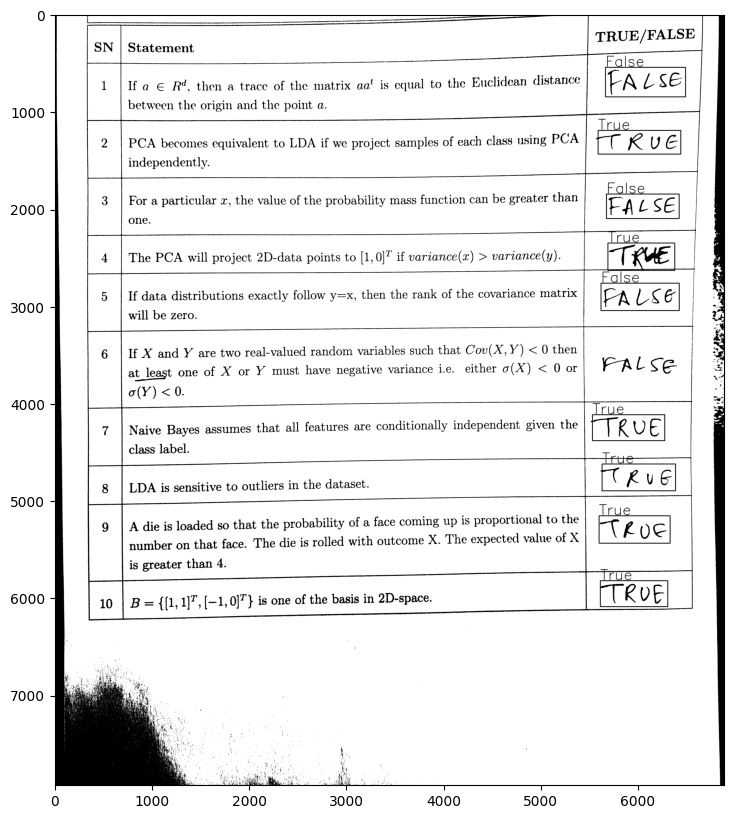

9 ['False', 'True', 'False', 'True', 'False', 'True', 'True', 'True', 'True']


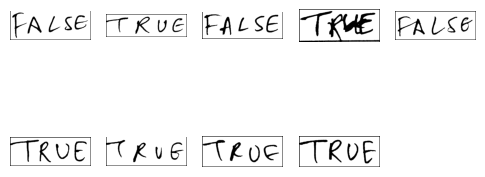

In [67]:
all_answers_images=[]
all_answers_text=[]
full_images=[]
for i in range(len(imgs)):
    image=imgs[i];
    path=arr[i];
    print(i+1)
    img,cur,text=extract_tf(image,path)
    all_answers_text.append(text)
    full_images.append(img)
    all_answers_images.append(cur)
    plt.figure(figsize=(10,10))
    plt.imshow(img,cmap='gray')
    plt.show()
    print(len(text),text)
    display_images(cur)


In [69]:
df=pd.DataFrame(all_answers_text)
df

,0,1,2,3,4,5,6,7,8,9
0,True,True,True,True,True,False,True,True,False,True
1,True,False,True,False,False,False,True,True,True,None
2,False,True,True,True,True,True,False,True,True,None
3,True,False,True,True,True,False,True,True,True,True
4,False,False,False,True,True,True,True,True,None,None
5,None,None,None,None,None,None,None,None,None,None
6,False,False,True,False,False,True,False,True,True,True
7,False,False,True,False,False,True,True,True,True,True
8,False,True,True,True,False,True,True,True,False,None
9,True,True,False,False,True,True,True,False,False,None


In [70]:
df.to_csv('test.csv')